In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2015


In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-0.37,0.88,1.37,1.70,1.40,1.05,0.48,-0.54,-0.73,-0.19,0.42,0.56
1,1.0,0.08,1.02,1.39,1.66,1.44,1.18,0.72,-0.07,-0.21,0.16,0.59,0.71
2,1.5,0.47,1.15,1.42,1.64,1.48,1.29,0.94,0.34,0.24,0.47,0.76,0.84
3,2.0,0.77,1.27,1.45,1.64,1.53,1.40,1.13,0.67,0.59,0.71,0.90,0.95
4,2.5,0.99,1.37,1.49,1.65,1.57,1.48,1.27,0.90,0.83,0.89,1.01,1.04


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,1.86080,1.935700,1.995400,2.057150,2.149650,2.149750,2.118450,1.870000,1.828600,1.781900,1.891550,1.820150
std,28.939592,0.30862,0.182915,0.149202,0.131039,0.177915,0.203881,0.267811,0.326484,0.351925,0.299006,0.270553,0.254368
min,0.500000,-0.37000,0.880000,1.370000,1.640000,1.400000,1.050000,0.480000,-0.540000,-0.730000,-0.190000,0.420000,0.560000
25%,25.375000,1.81750,1.887500,1.957500,2.007500,2.110000,2.120000,2.087500,1.857500,1.807500,1.747500,1.855000,1.765000
50%,50.250000,1.99000,2.020000,2.060000,2.120000,2.230000,2.230000,2.230000,1.990000,1.965000,1.910000,2.010000,1.940000
75%,75.125000,2.01250,2.040000,2.090000,2.150000,2.260000,2.270000,2.270000,2.020000,2.000000,1.940000,2.050000,1.972500
max,100.000000,2.03000,2.060000,2.110000,2.160000,2.280000,2.290000,2.290000,2.040000,2.020000,1.950000,2.070000,1.990000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,5.988241,4.011005,3.506683,3.263329,4.195716,4.526721,5.640239,6.027085,6.750678,6.039950,5.874435,5.781470
Jan,5.988241,0.095247,0.055544,0.043490,0.035486,0.051493,0.061067,0.081595,0.100183,0.108172,0.091776,0.081588,0.075645
Feb,4.011005,0.055544,0.033458,0.026776,0.022647,0.031600,0.036624,0.048301,0.057729,0.062668,0.053891,0.048872,0.046015
Mar,3.506683,0.043490,0.026776,0.022261,0.019168,0.026464,0.030047,0.038992,0.045305,0.049443,0.043048,0.039911,0.037791
Apr,3.263329,0.035486,0.022647,0.019168,0.017171,0.022712,0.025134,0.032197,0.036237,0.039925,0.035332,0.033424,0.032317
May,4.195716,0.051493,0.031600,0.026464,0.022712,0.031654,0.035919,0.046505,0.053929,0.058917,0.051257,0.047583,0.044938
June,4.526721,0.061067,0.036624,0.030047,0.025134,0.035919,0.041567,0.054376,0.064496,0.070043,0.060239,0.055030,0.051338
July,5.640239,0.081595,0.048301,0.038992,0.032197,0.046505,0.054376,0.071723,0.086273,0.093425,0.079875,0.072202,0.067044
Aug,6.027085,0.100183,0.057729,0.045305,0.036237,0.053929,0.064496,0.086273,0.106592,0.114753,0.096921,0.085881,0.078771
Sept,6.750678,0.108172,0.062668,0.049443,0.039925,0.058917,0.070043,0.093425,0.114753,0.123851,0.104867,0.093256,0.085923


In [5]:
df.var()

Matuarity    837.500000
Jan            0.095247
Feb            0.033458
Mar            0.022261
Apr            0.017171
May            0.031654
June           0.041567
July           0.071723
Aug            0.106592
Sept           0.123851
Oct            0.089404
Nov            0.073199
Dec            0.064703
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-0.37,0.88,1.37,1.70,1.40,1.05,0.48,-0.54,-0.73,-0.19,0.42,0.56
1,1.0,0.08,1.02,1.39,1.66,1.44,1.18,0.72,-0.07,-0.21,0.16,0.59,0.71
2,1.5,0.47,1.15,1.42,1.64,1.48,1.29,0.94,0.34,0.24,0.47,0.76,0.84
3,2.0,0.77,1.27,1.45,1.64,1.53,1.40,1.13,0.67,0.59,0.71,0.90,0.95
4,2.5,0.99,1.37,1.49,1.65,1.57,1.48,1.27,0.90,0.83,0.89,1.01,1.04


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

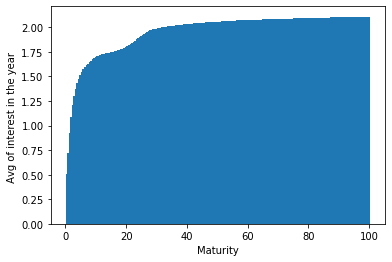

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 32 weeks

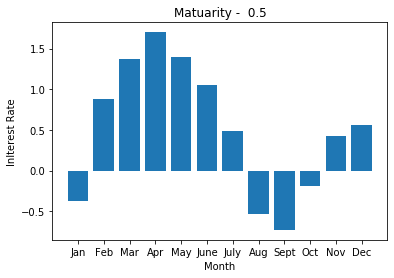

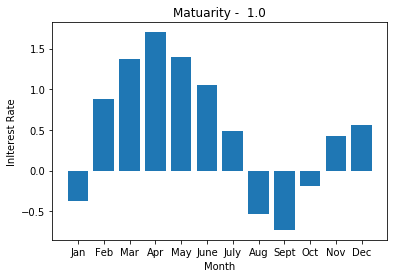

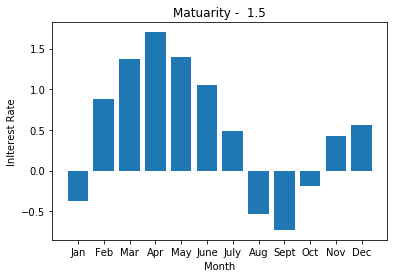

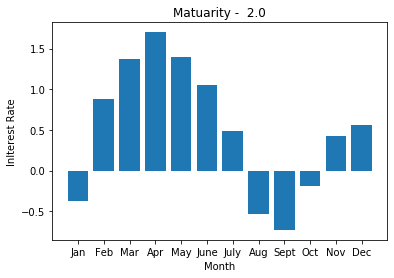

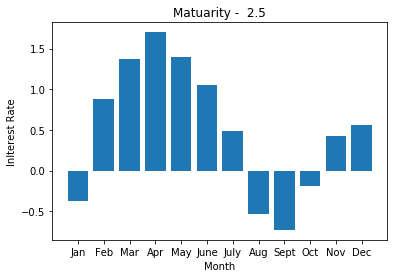

...

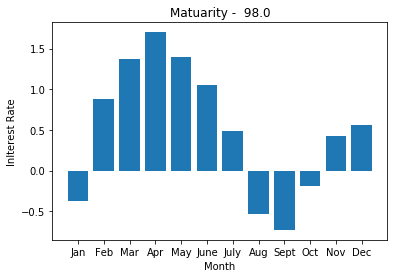

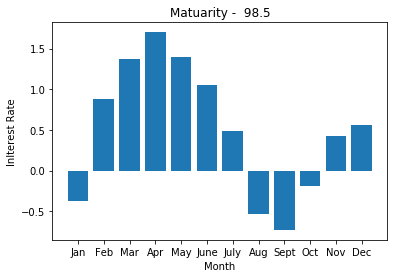

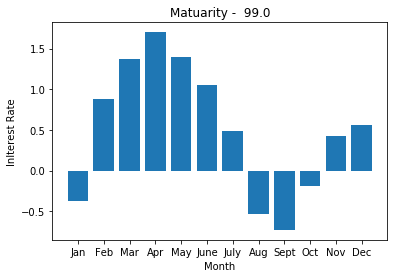

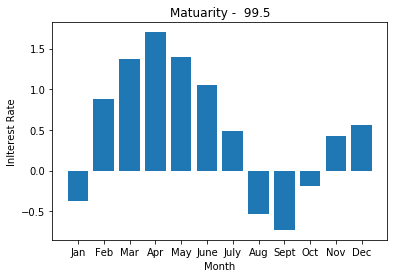

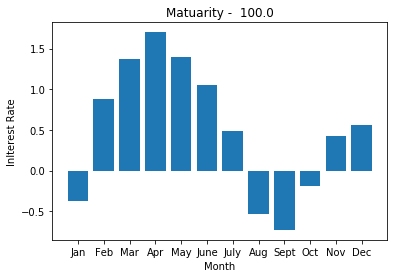

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

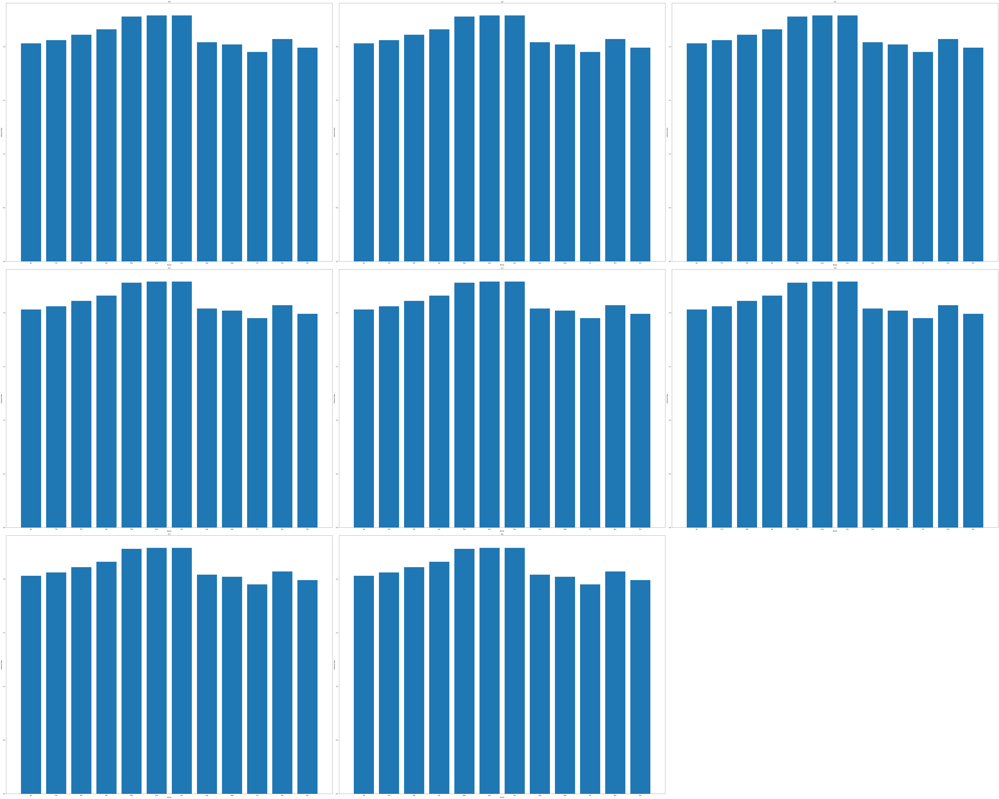

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

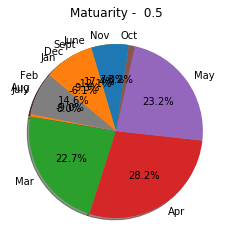

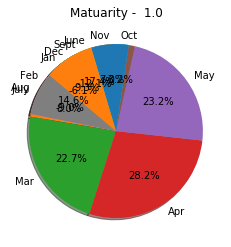

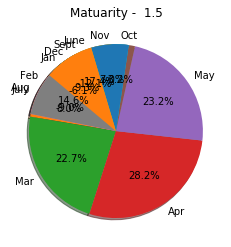

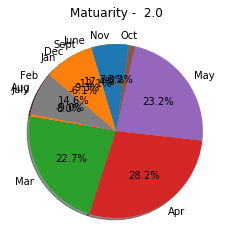

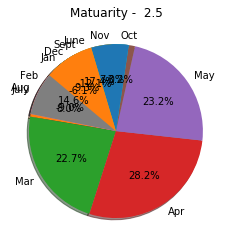

...

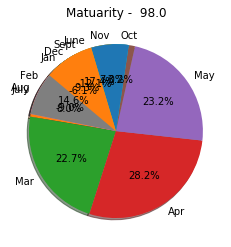

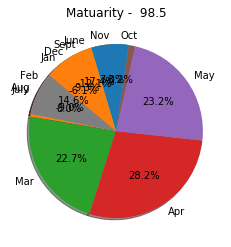

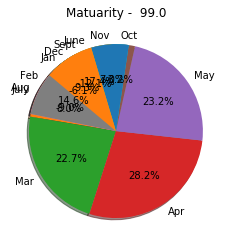

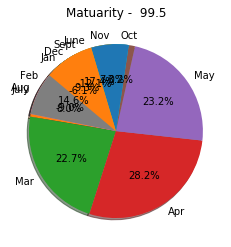

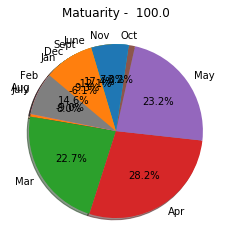

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

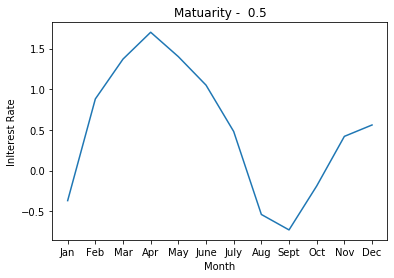

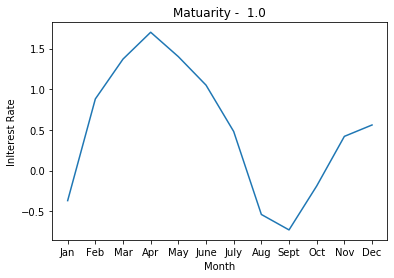

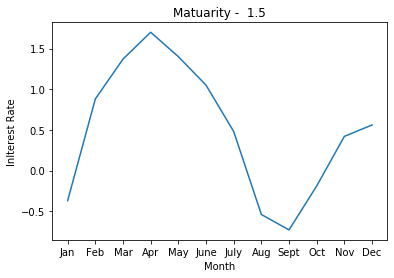

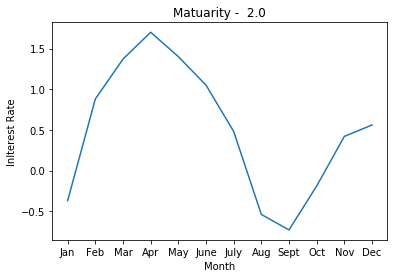

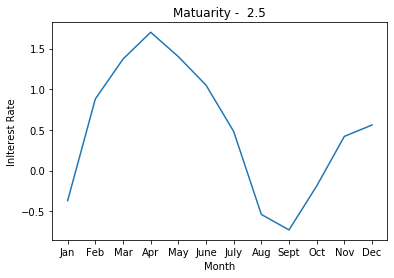

...

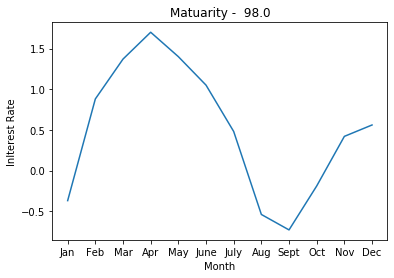

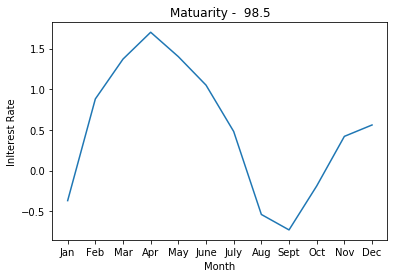

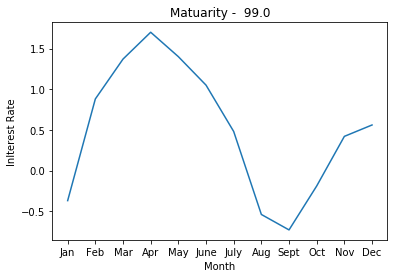

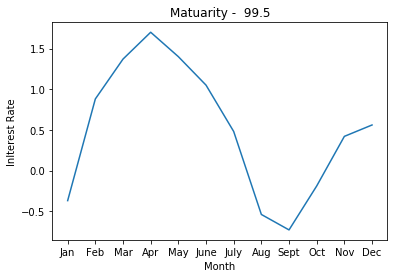

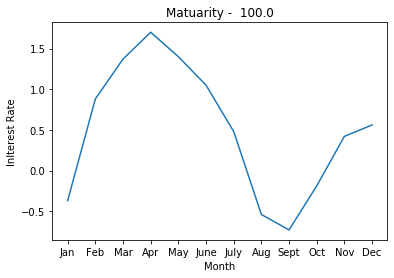

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

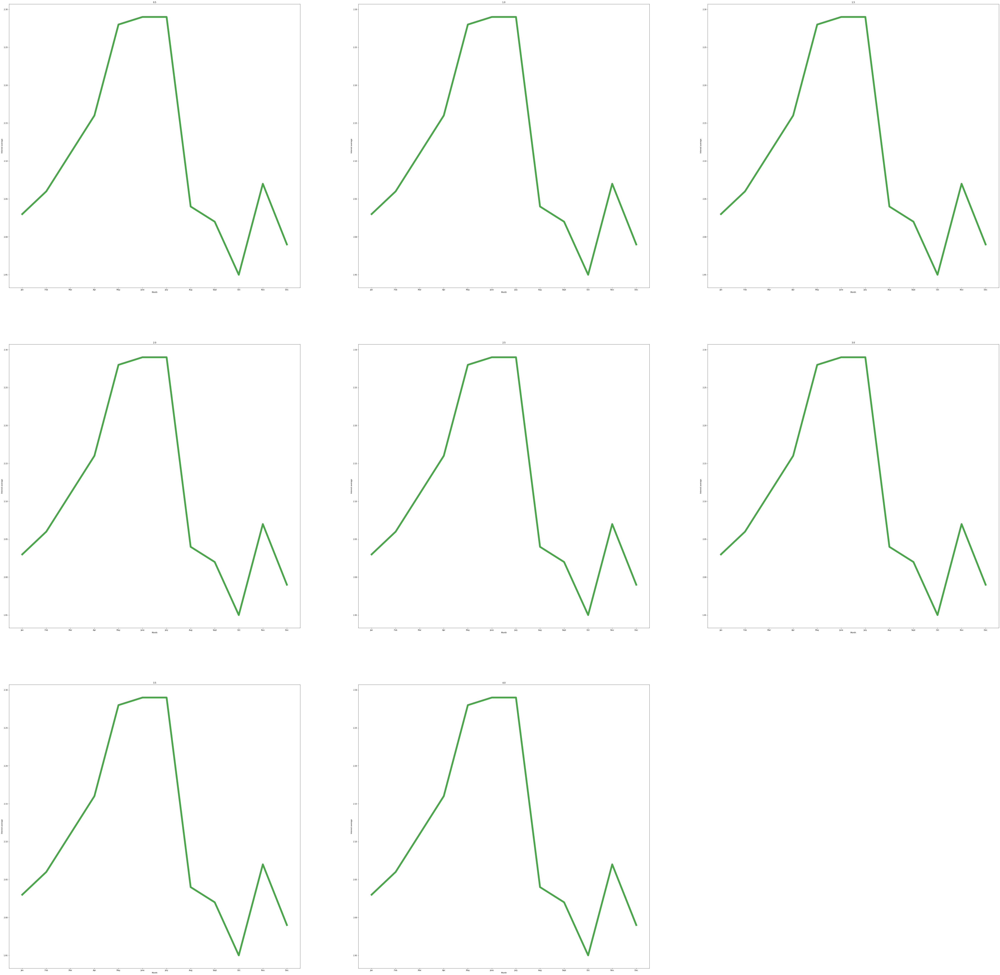

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [16]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

1.954925